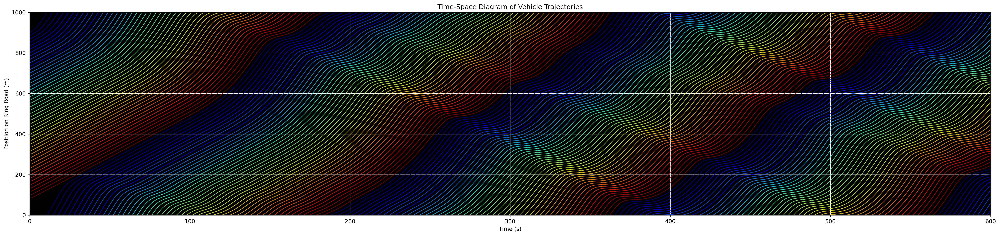

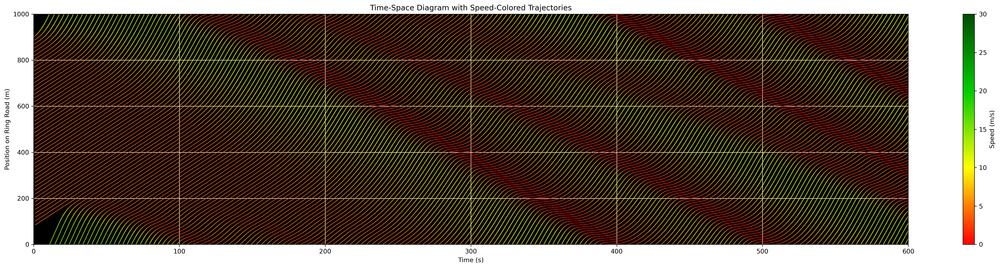

In [1]:
import xml.etree.ElementTree as ET
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.collections import LineCollection

# Define the custom colormap
colors = [(1, 0, 0), (1, 1, 0), (0, 0.8, 0), (0, 0.3, 0)]
green_to_red = LinearSegmentedColormap.from_list('GreenToRed', colors, N=256)

# Parse XML data
tree = ET.parse('output_fcd.xml')  # Replace with your file path
root = tree.getroot()
ring_length = 1000.0
vehicles = {}

for timestep in root.findall('timestep'):
    time = float(timestep.get('time'))
    for vehicle in timestep.findall('vehicle'):
        vid = vehicle.get('id')
        lane = vehicle.get('lane')
        pos = float(vehicle.get('pos'))
        speed = float(vehicle.get('speed'))
        if lane == 'a_0':
            ring_pos = pos
        elif lane == 'b_0':
            ring_pos = 901.53 + pos
        elif lane == ':8/1_0_0':
            ring_pos = 901.53 + pos
        elif lane == ':9/1_0_0':
            ring_pos = 901.53 + 99.23 + pos
        else:
            continue
        ring_pos = min(ring_pos, ring_length)
        if vid not in vehicles:
            vehicles[vid] = {'laps': [[]]}
        current_lap = vehicles[vid]['laps'][-1]
        if current_lap:
            prev_ring_pos = current_lap[-1][1]
            if prev_ring_pos > ring_length - 100 and ring_pos < 100:
                vehicles[vid]['laps'].append([(time, ring_pos, speed)])
            else:
                current_lap.append((time, ring_pos, speed))
        else:
            current_lap.append((time, ring_pos, speed))

# Collect segments and speeds for colored plot
all_segments = []
all_speeds = []
for vid, data in vehicles.items():
    for lap in data['laps']:
        if len(lap) < 2:
            continue
        for i in range(len(lap) - 1):
            t1, p1, s1 = lap[i]
            t2, p2, s2 = lap[i + 1]
            segment = np.array([[t1, p1], [t2, p2]])
            all_segments.append(segment)
            all_speeds.append(s1)

# PLOT 1: Vehicle trajectories with different colors per vehicle
plt.figure(figsize=(25, 6), dpi=300)

# Assign distinct colors to each vehicle using the hsv colormap
num_vehicles = len(vehicles)
vehicle_colors = plt.cm.jet(np.linspace(0, 1, num_vehicles))

# Prepare segments for LineCollection for first plot
all_segments_by_vehicle = []
vehicle_indices = []
for idx, (vid, data) in enumerate(vehicles.items()):
    for lap in data['laps']:
        if len(lap) < 2:
            continue
        points = np.array([(t, p) for t, p, s in lap])
        points = points.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)
        all_segments_by_vehicle.extend(segments)
        vehicle_indices.extend([idx] * len(segments))

# Create LineCollection with distinct colors per vehicle
lc_vehicle = LineCollection(all_segments_by_vehicle, colors=[vehicle_colors[i] for i in vehicle_indices], linewidth=1)

# Add to plot
ax = plt.gca()
ax.add_collection(lc_vehicle)
plt.xlabel('Time (s)')
plt.ylabel('Position on Ring Road (m)')
plt.xlim(0, 600)
plt.ylim(0, 1000)
plt.title('Time-Space Diagram of Vehicle Trajectories')
# Set background to black
ax.set_facecolor('black')
# Adjust grid color for visibility
plt.grid(True, color='white')
plt.tight_layout()
plt.savefig('time_space_diagram(relaxed).png', dpi=300)
plt.show()
plt.close()

# PLOT 2: Speed-colored trajectories
# Increase DPI for vibrant colors and set figure size
fig, ax = plt.subplots(figsize=(25, 6), dpi=300)

# Create LineCollection with speed-based coloring
lc_speed = LineCollection(all_segments, cmap=green_to_red, norm=plt.Normalize(0, 30))
lc_speed.set_array(np.array(all_speeds))
lc_speed.set_linewidth(1)

ax.add_collection(lc_speed)

# Find max time value
max_time = max([t for data in vehicles.values() for lap in data['laps'] for t, _, _ in lap] or [600])
ax.set_xlim(0, 600)
ax.set_ylim(0, ring_length)
ax.set_xlabel('Time (s)')
ax.set_ylabel('Position on Ring Road (m)')
ax.set_title('Time-Space Diagram with Speed-Colored Trajectories')

# Set background to black
ax.set_facecolor('black')

# Adjust grid color for visibility
ax.grid(True, color='white')

# Add colorbar
cbar = fig.colorbar(lc_speed, ax=ax)
cbar.set_label('Speed (m/s)')

plt.tight_layout()
plt.savefig('time_space_diagram_with_speed(relaxed).png', dpi=300)
plt.show()
plt.close()
